# 基本的图像操作和处理

In [41]:
from PIL import Image

pil_im = Image.open('./assets/mountain.jpg')

In [2]:
import matplotlib.pyplot as plt

%matplotlib inline

In [24]:
def show_img(pil_im, figsize=None):
    plt.figure(figsize=figsize)
    plt.imshow(pil_im)
    plt.xticks([])
    plt.yticks([])
    plt.show()

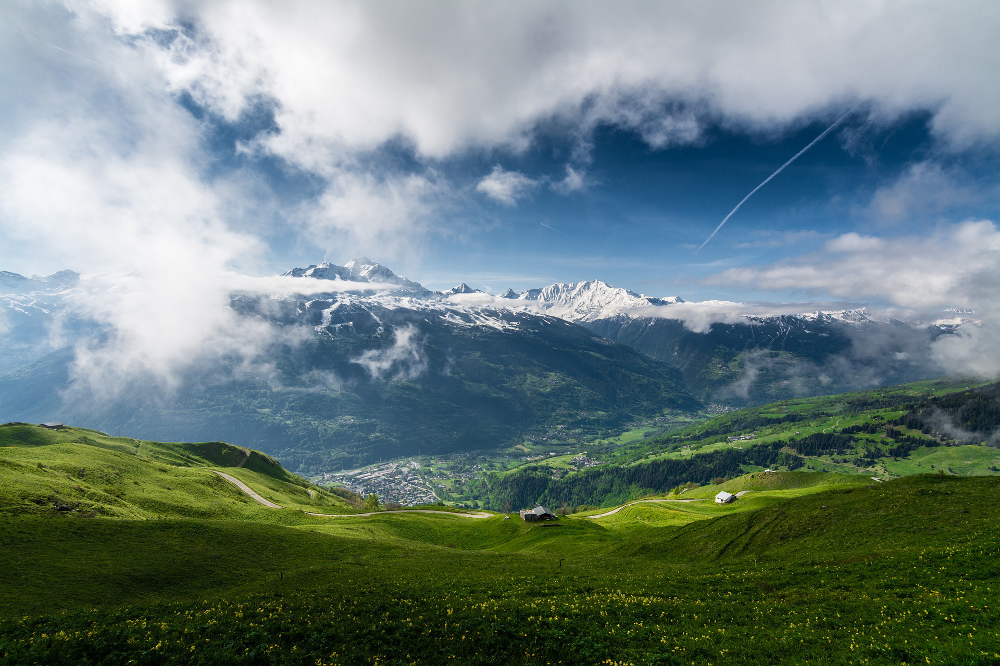

In [37]:
pil_im

In [35]:
pil_im.resize((128, 128)).size

(128, 128)

In [17]:
# 图片转换
pil_im.save('/Users/fenghuabin/Pictures/mountain.png')

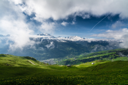

In [40]:
pil_im.thumbnail((128, 128))
pil_im

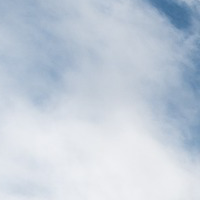

In [51]:
box = (200, 200, 400, 400)
pil_im.crop(box)

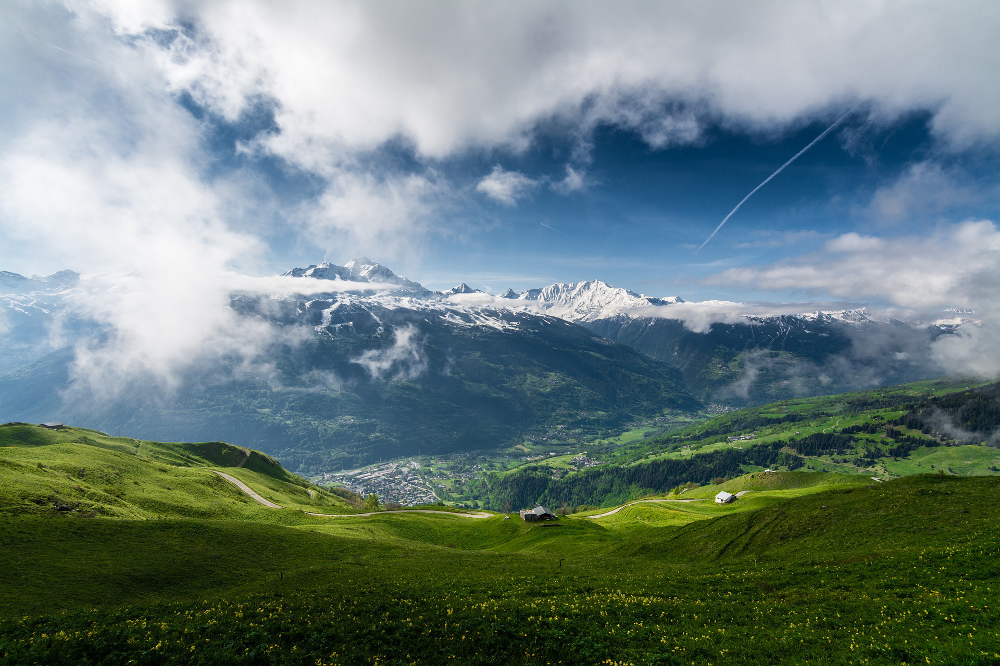

In [55]:
pil_im.paste(pil_im.crop(box).rotate(90), box)
pil_im

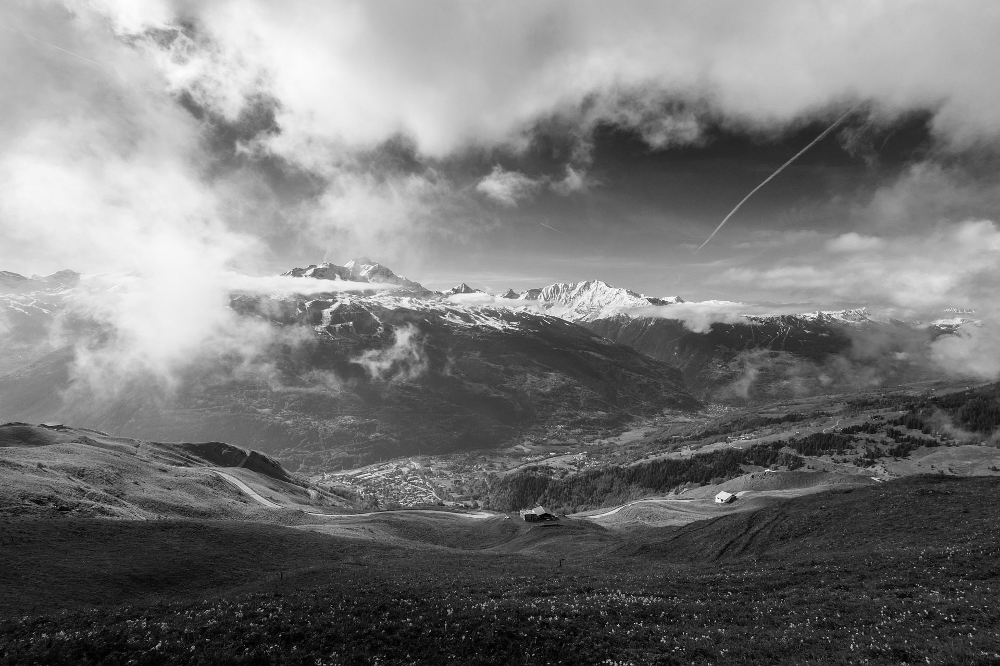

In [65]:
pil_im.convert('L')

In [68]:
import pylab

im = pylab.array(pil_im.convert('L'))

In [70]:
im.shape

(1280, 1920)

In [71]:
import numpy as np

np_im = np.asarray(pil_im.convert('L'))

(0.5, 1919.5, 0.5, 1279.5)

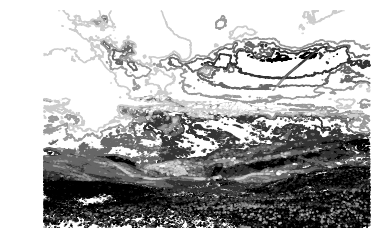

In [78]:
pylab.gray()
pylab.contour(np_im, origin='image')
pylab.axis('off')
pylab.axis('equal')

In [80]:
im.dtype

dtype('uint8')

In [103]:
imhist, bins = pylab.histogram(im.flatten(), 255)

In [109]:
pylab.histogram?

In [ ]:
def histeq(im, nbr_bins=256):
    imhist, bins = np.histogram(im.flatten(), nbr)
    cdf = imhist.cumsum()
    cdf = 255*cdf/cdf[-1]
    im2 = np.interp

In [112]:
a = [3,2,1,6,5,5,6,5]
np.histogram(a, 3)

(array([2, 1, 5]), array([1.        , 2.66666667, 4.33333333, 6.        ]))

In [117]:
def myhistogram(a, bins=10):
    max_v, min_v = max(a), min(a)
    hist, bin_edges = [0]*bins, [0]*(bins+1)
    interval = (max_v-min_v)*1.0/bins
    for i in range(bins+1):
        bin_edges[i] = min_v + i*interval
    for v in a:
        if v>=max_v:
            hist[-1] += 1
        else:
            hist[int((v-min_v)/interval)] += 1
    return hist, bin_edges

myhistogram(a, 3)

([2, 1, 5], [1.0, 2.666666666666667, 4.333333333333334, 6.0])

In [132]:
def myinterp(a, xp, fp):
    result = []
    for v in a:
        if v <= xp[0]:
            result.append(fp[0])
        elif v >= xp[-1]:
            result.append(fp[-1])
        else:
            for i in range(1, len(xp)):
                if xp[i] == v:
                    result.append(fp[i])
                    break
                elif xp[i] > v:
                    x0, x1 = xp[i-1], xp[i]
                    y0, y1 = fp[i-1], fp[i]
                    result.append(y0+(y1-y0)/(x1-x0)*(v-x0))
                    break
    return np.array(result)

im = np.array([
    [7, 7, 7, 1, 1],
    [6, 7, 7, 0, 0],
    [6, 7, 0, 1, 1],
    [7, 6, 0, 0, 0],
    [5, 3, 0, 0, 0]
])
imhist, bins = np.histogram(im.flatten(), 8)
# myhistogram(im.flatten(), 8)
cdf = imhist.cumsum()
cdf = 7 * cdf / cdf[-1]
myinterp(im.flatten(), bins[:-1], cdf).reshape(im.shape)

array([[7.  , 7.  , 7.  , 3.64, 3.64],
       [6.72, 7.  , 7.  , 2.52, 2.52],
       [6.72, 7.  , 2.52, 3.64, 3.64],
       [7.  , 6.72, 2.52, 2.52, 2.52],
       [4.8 , 3.92, 2.52, 2.52, 2.52]])

In [130]:
im = np.array([
    [7, 7, 7, 1, 1],
    [6, 7, 7, 0, 0],
    [6, 7, 0, 1, 1],
    [7, 6, 0, 0, 0],
    [5, 3, 0, 0, 0]
])
imhist, bins = np.histogram(im.flatten(), 8)
# myhistogram(im.flatten(), 8)
cdf = imhist.cumsum()
print(cdf)
cdf = 7 * cdf / cdf[-1]
print(cdf)
np.interp(im.flatten(), bins[:-1], cdf).reshape(im.shape)

[ 9 13 13 14 14 15 18 25]
[2.52 3.64 3.64 3.92 3.92 4.2  5.04 7.  ]


array([[7.  , 7.  , 7.  , 3.64, 3.64],
       [6.72, 7.  , 7.  , 2.52, 2.52],
       [6.72, 7.  , 2.52, 3.64, 3.64],
       [7.  , 6.72, 2.52, 2.52, 2.52],
       [4.8 , 3.92, 2.52, 2.52, 2.52]])

In [122]:
a = np.array([20,10,1,1,2,3,5,4])
cdf = a.cumsum()
cdf = 8*cdf/cdf[-1]
bins = [float(i) for i in range(9)]
im2 = np.interp(a, bins[:-1], cdf)
im2

array([8.        , 8.        , 5.2173913 , 5.2173913 , 5.39130435,
       5.56521739, 6.43478261, 5.91304348])

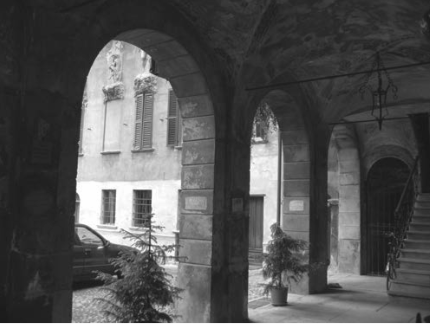

In [148]:
pil_im = Image.open('assets/heq_demo.png')
pil_im = pil_im.convert('L')
pil_im

In [147]:
type(pil_im)

PIL.Image.Image

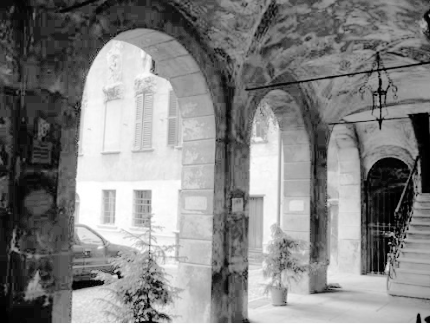

In [149]:
def myhisteq(im, nbr_bins=256):
    """
    @im: PIL.Image.Image, mode is L
    @return: PIL.Image.Image
    """
    np_im = np.asarray(im)
    imhist, bins = np.histogram(np_im.flatten(), nbr_bins)
    csum = np.cumsum(imhist)
    csum = 255 * csum / csum[-1]
    new_np_im = np.interp(np_im.flatten(), bins[:-1], csum)
    return Image.fromarray(new_np_im.reshape(np_im.shape).astype(np.uint8))

myhisteq(pil_im)